# Art Identifier

* Student name: A. Utku Kale
* Student pace: NYC/Full time
* Scheduled project review date/time: 4/1/23
* Instructor name: Brendan Hutchinson & Joseph Mata
* Blog post URL: https://medium.com/@utkukale 

Metropolitan Museum of Art
![image.png](met.jpg)

## Project Overwiev 

This machine learning project is focused on identifying the painter of a painting from an image and can be used to help with the authentication and verification of artwork. The Metropolitan Museum of Art can use this model to determine the authenticity of paintings attributed to the 5 artists: Van Gogh, Durer, Picasso, Titian, and Rembrandt. The model is trained using a dataset of paintings by the 5 artists and uses deep learning techniques to extract features from the images. By analyzing the unique style and characteristics of each artist's work, the model can compare a new painting to known works by the same artist and provide an expert opinion on its authenticity.

For example, let's say a collector or dealer approached the museum with a painting attributed to Titian. By using your artist identifier to analyze the painting's unique brushstrokes, color palette, and other characteristics, the museum could compare it to other known works by Titian that were created during the same time period. If the painting's style and characteristics align with those of Titian's other works, it would provide additional evidence for its authenticity. However, if the painting's style and characteristics do not align with those of Titian's other works, it could indicate that the painting is a forgery or imitation. In this case, the museum could provide an expert opinion on the painting's authenticity based on the analysis conducted using your artist identifier.

The project involves preprocessing the image data, model training, and evaluation using metrics such as accuracy. This project can be used to prevent the spread of forgeries and imitations, ensuring the integrity of the art market.

## Data

The dataset used for this machine learning project is a Best Artworks of All Time dataset obtained from Kaggle, 50 most-influential artists, 8400+ paintings in total.  
The data was scraped from artchallenge.ru during the end of February 2019.
https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time

Below is the list of 50 artists.

Albrecht Dürer, Alfred Sisley, Amedeo Modigliani, Andrei Rublev, Andy Warhol, Camille Pissarro, Caravaggio, Claude Monet, Diego Rivera, Diego Velazquez, Edgar Degas, Edouard Manet, Edvard Munch, El Greco, Eugene Delacroix, Francisco Goya, Frida Kahlo, Georges Seurat, Giotto di Bondone, Gustav Klimt, Gustave Courbet, Henri Matisse, Henri Rousseau, Henri de Toulouse-Lautrec, Hieronymus Bosch, Jackson Pollock, Jan van Eyck, Joan Miro, Kazimir Malevich, Leonardo da Vinci, Marc Chagall, Michelangelo, Mikhail Vrubel, Pablo Picasso, Paul Cezanne, Paul Gauguin, Paul Klee, Peter Paul Rubens, Pierre-Auguste Renoir, Piet Mondrian, Pieter Bruegel, Raphael, Rembrandt, Rene Magritte, Salvador Dali, Sandro Botticelli, Titian, Vasiliy Kandinskiy, Vincent van Gogh, William Turner.

Art Identifier model aims to identify paintings for 5 artists below.

- Vincent Van Gogh
- Pablo Picasso
- Rembrandt
- Titian
- Albrecht Dürer

## Project steps
This machine learning project involved several key phases. Firstly, I conducted an exploratory data analysis phase to understand the distribution of the data. I then performed data augmentation and preprocessing of the image data by resizing the images, converting them to RGB, and normalizing pixel values. Next, I created baseline convolutional neural network models and more advanced models using transfer learning techniques, such as pre-trained models like VGG16 and VGG19. I evaluated the performance of these models on a hold-out test set and identified the best-performing model for rating prediction. The evaluation metric for this project is accuracy.

In [60]:
# Loading the required libraries
# System and file operations
import os
import glob
import shutil
import pathlib

# Data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Image processing and augmentation
from PIL import Image
import Augmentor
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Machine learning models and utilities
import tensorflow as tf
import keras
from keras.models import Model, Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization, Input, Activation, ZeroPadding2D
from keras.applications import vgg16, vgg19, ResNet50
from keras.optimizers import Adam, SGD
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.regularizers import l2

## Exploratory Data Analysis & Observing Sample Images

In this part, I will conduct EDA on the data to understand the distributions. Furthermore EDA will include sample data observation.

In [115]:
# Import the pandas library and read the 'artists.csv' file into a DataFrame called 'df'
df = pd.read_csv('artists.csv')

# Sort the DataFrame 'df' by the 'paintings' column in descending order
df.sort_values(by='paintings', ascending=False).head(10)

,id,name,years,genre,nationality,bio,wikipedia,paintings
8,8,Vincent van Gogh,1853 – 1890,Post-Impressionism,Dutch,Vincent Willem van Gogh (Dutch: [ˈvɪnsɛnt ˈʋɪl...,http://en.wikipedia.org/wiki/Vincent_van_Gogh,877
30,30,Edgar Degas,1834 - 1917,Impressionism,French,Edgar Degas (US: or UK: ; born Hilaire-Germai...,http://en.wikipedia.org/wiki/Edgar_Degas,702
13,13,Pablo Picasso,1881 - 1973,Cubism,Spanish,Pablo Ruiz Picasso (; Spanish: [ˈpaβlo piˈkaso...,http://en.wikipedia.org/wiki/Pablo_Picasso,439
15,15,Pierre-Auguste Renoir,1841 - 1919,Impressionism,French,"Pierre-Auguste Renoir, commonly known as Augus...",http://en.wikipedia.org/wiki/Pierre-Auguste_Re...,336
19,19,Albrecht Dürer,1471 - 1528,Northern Renaissance,German,Albrecht Dürer (; German: [ˈʔalbʁɛçt ˈdyːʁɐ]; ...,http://en.wikipedia.org/wiki/Albrecht_Dürer,328
46,46,Paul Gauguin,1848 – 1903,"Symbolism,Post-Impressionism",French,"Eugène Henri Paul Gauguin (UK: , US: ; French:...",http://en.wikipedia.org/wiki/Paul_Gauguin,311
16,16,Francisco Goya,1746 - 1828,Romanticism,Spanish,Francisco José de Goya y Lucientes (; Spanish:...,http://en.wikipedia.org/wiki/Francisco_Goya,291
31,31,Rembrandt,1606 - 1669,Baroque,Dutch,Rembrandt Harmenszoon van Rijn (; Dutch: [ˈrɛm...,http://en.wikipedia.org/wiki/Rembrandt,262
20,20,Alfred Sisley,1839 - 1899,Impressionism,"French,British",Alfred Sisley (; French: [sislɛ]; 30 October 1...,http://en.wikipedia.org/wiki/Alfred_Sisley,259
32,32,Titian,1488 - 1576,"High Renaissance,Mannerism",Italian,Tiziano Vecelli or Tiziano Vecellio (pronounce...,http://en.wikipedia.org/wiki/Titian,255


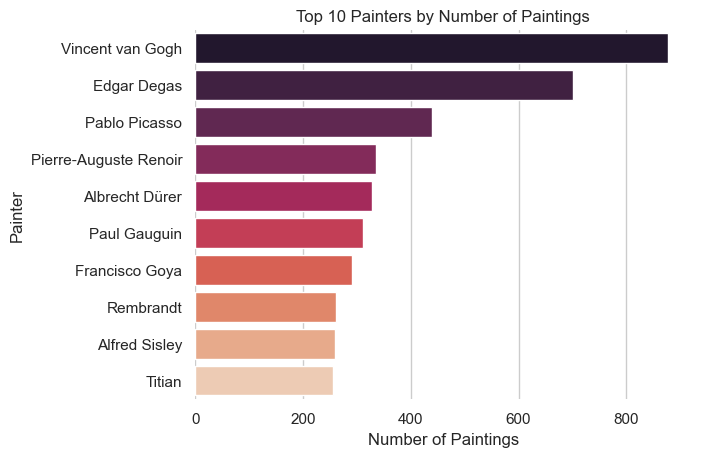

In [116]:
# Sort the dataframe by the 'paintings' column and select the top 10 rows
top_10 = df.sort_values(by='paintings', ascending=False).head(10)

# Create the barplot using Seaborn
sns.set(style='whitegrid')
ax = sns.barplot(x='paintings', y='name', data=top_10, palette='rocket')

# Set the title and axis labels
ax.set_title('Top 10 Painters by Number of Paintings')
ax.set_xlabel('Number of Paintings')
ax.set_ylabel('Painter')

# Show the plot
sns.despine(left=True, bottom=True)

Let's focus on our target painters Vincent Van Gogh, Pablo Picasso, Rembrandt, Titian and Albrecht Dürer.


In [117]:
# Select the rows for the 5 painters
painters = ['Vincent van Gogh', 'Pablo Picasso', 'Rembrandt', 'Titian', 'Albrecht Dürer']
target = df[df['name'].isin(painters)]

# Sort the dataframe by the 'paintings' column in descending order
target = target.sort_values(by='paintings', ascending=False)
target

,id,name,years,genre,nationality,bio,wikipedia,paintings
8,8,Vincent van Gogh,1853 – 1890,Post-Impressionism,Dutch,Vincent Willem van Gogh (Dutch: [ˈvɪnsɛnt ˈʋɪl...,http://en.wikipedia.org/wiki/Vincent_van_Gogh,877
13,13,Pablo Picasso,1881 - 1973,Cubism,Spanish,Pablo Ruiz Picasso (; Spanish: [ˈpaβlo piˈkaso...,http://en.wikipedia.org/wiki/Pablo_Picasso,439
19,19,Albrecht Dürer,1471 - 1528,Northern Renaissance,German,Albrecht Dürer (; German: [ˈʔalbʁɛçt ˈdyːʁɐ]; ...,http://en.wikipedia.org/wiki/Albrecht_Dürer,328
31,31,Rembrandt,1606 - 1669,Baroque,Dutch,Rembrandt Harmenszoon van Rijn (; Dutch: [ˈrɛm...,http://en.wikipedia.org/wiki/Rembrandt,262
32,32,Titian,1488 - 1576,"High Renaissance,Mannerism",Italian,Tiziano Vecelli or Tiziano Vecellio (pronounce...,http://en.wikipedia.org/wiki/Titian,255


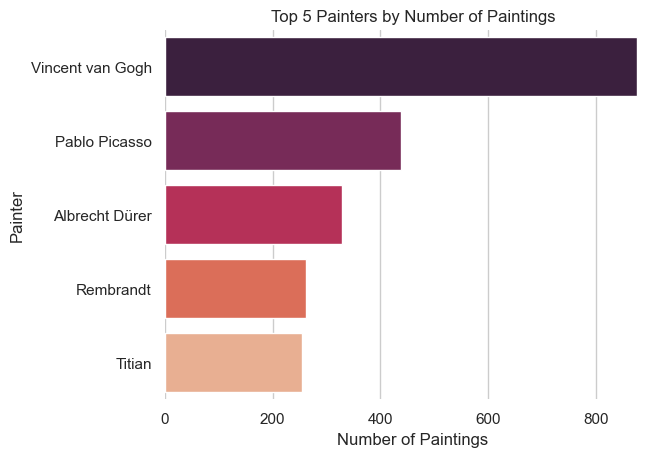

In [118]:
# Create the barplot using Seaborn
sns.set(style='whitegrid')
ax = sns.barplot(x='paintings', y='name', data=target, palette='rocket')

# Set the title and axis labels
ax.set_title('Top 5 Painters by Number of Paintings')
ax.set_xlabel('Number of Paintings')
ax.set_ylabel('Painter')

# Show the plot
sns.despine(left=True, bottom=True)

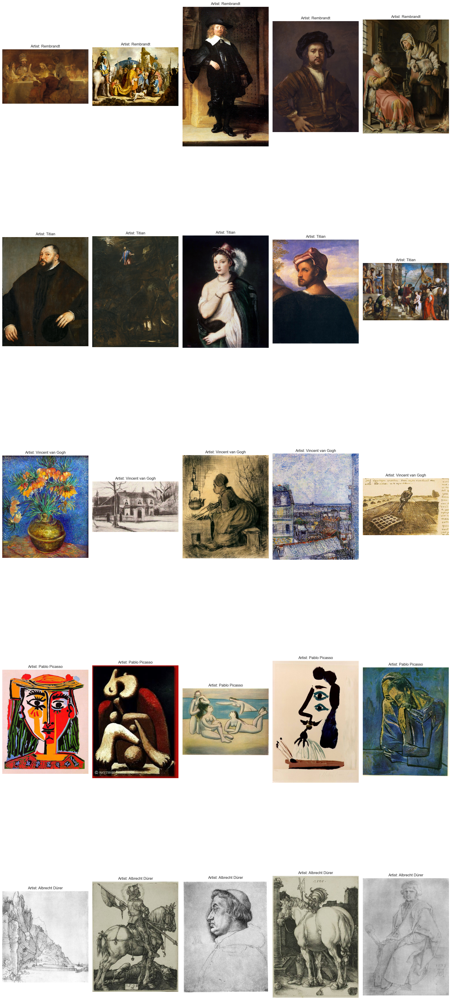

In [119]:
# Show 5 random images from each artist
images_dir = '/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/images/images'
artists_top_name = ['Rembrandt', 'Titian', 'Vincent_van_Gogh', 'Pablo_Picasso', 'Albrecht_Dürer']
n = 5
fig, axes = plt.subplots(nrows=len(artists_top_name), ncols=n, figsize=(20, 10*len(artists_top_name)))

for i, artist_name in enumerate(artists_top_name):
    artist_dir = os.path.join(images_dir, artist_name)
    random_images = random.sample(os.listdir(artist_dir), n)
    for j, random_image in enumerate(random_images):
        random_image_file = os.path.join(artist_dir, random_image)
        image = plt.imread(random_image_file)
        axes[i, j].imshow(image)
        axes[i, j].set_title("Artist: " + artist_name.replace('_', ' '))
        axes[i, j].axis('off')
plt.tight_layout()
plt.show()

I will seperate and move 250 images for each target artist to another folder. Working with balanced dataset will help me create a better model.

In [120]:
# Set the paths for the source and output folders
input_folder = '/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/images/images'
output_folder = '/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artist'

# Set the names of the target folders
target_folders = ['Rembrandt', 'Titian', 'Vincent_van_Gogh', 'Pablo_Picasso', 'Albrecht_Dürer']

# Loop through each target folder and copy 250 random images to the output folder
for folder_name in target_folders:
    # Set the path to the current target folder
    folder_path = os.path.join(input_folder, folder_name)
    
    # Get a list of all the images in the target folder
    images = os.listdir(folder_path)
    
    # Choose 250 random images from the list
    random_images = random.sample(images, 250)
    
    # Set the path to the output folder for this target folder
    output_folder_path = os.path.join(output_folder, folder_name)
    
    # Create the output folder if it doesn't already exist
    os.makedirs(output_folder_path, exist_ok=True)
    
    # Loop through each random image and copy it to the output folder
    for image_name in random_images:
        image_path = os.path.join(folder_path, image_name)
        output_image_path = os.path.join(output_folder_path, image_name)
        shutil.copyfile(image_path, output_image_path)



## Convolutional Neural Network Models

### Train, Validation and Test Split

In [129]:
# Define the path to the directory containing the images
img_dir = pathlib.Path('/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artist')

# Use splitfolders to split the images into train/validation/test sets with a ratio of 70/20/10,
# and save the resulting split data in a new directory called '5artistsplit'
# (group_prefix=None specifies that the subfolders should not be prefixed with 'train', 'val', or 'test')
splitfolders.ratio(img_dir, output="5artistsplit", seed=10, ratio=(.7, .2, .1), group_prefix=None) # default values

Copying files: 1250 files [00:03, 337.32 files/s]


In [2]:
# Define three variables representing the paths to the training, validation, and testing directories
train_dir = "/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train/"
validation_dir = "/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/val/"
test_dir = "/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/test/"

In [3]:
# Define three ImageDataGenerator objects - train_datagen, val_datagen, and test_datagen -
# to perform data augmentation and preprocessing on the training, validation, and testing datasets
train_datagen = ImageDataGenerator(
    rescale=1./255                  # rescale pixel values to the range [0, 1]
)

val_datagen = ImageDataGenerator(
    rescale=1./255                  # rescale pixel values to the range [0, 1]
)

test_datagen = ImageDataGenerator(
    rescale=1./255                  # rescale pixel values to the range [0, 1]
)


In [4]:
# Define the height and width dimensions of the input images
img_height = 180
img_width = 180

# Define the batch size used during training and evaluation
batch_size = 25

# Define the number of classes in the classification problem
num_classes = 5


In [5]:
# Use the flow_from_directory method to create the data generators for training, validation and testing data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical', shuffle = False
)

Found 875 images belonging to 5 classes.
Found 250 images belonging to 5 classes.
Found 125 images belonging to 5 classes.


After splitting, I have 875 images in training set, 250 images in validation set and 125 images in test set.

### Base Model 

In [8]:
# Creating an early stop on validation loss to use in models.
early_stop = EarlyStopping(monitor='val_loss', patience=3, verbose=1)

In [154]:
model0 = Sequential()
model0.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model0.add(MaxPooling2D(pool_size=(2, 2)))
model0.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model0.add(MaxPooling2D(pool_size=(2, 2)))
model0.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model0.add(MaxPooling2D(pool_size=(2, 2)))
model0.add(Flatten())
model0.add(Dense(32, activation='relu')) 

model0.add(Dense(num_classes, activation='softmax'))

In [155]:
model0.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [156]:
hist0 = model0.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-19 22:52:13.419525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - ETA: 0s - loss: 1.4529 - accuracy: 0.3657

2023-04-19 22:53:02.857048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 59s 2s/step - loss: 1.4529 - accuracy: 0.3657 - val_loss: 1.0590 - val_accuracy: 0.5440
Epoch 2/20
35/35 [==============================] - 51s 1s/step - loss: 0.9070 - accuracy: 0.6297 - val_loss: 0.8226 - val_accuracy: 0.6440
Epoch 3/20
35/35 [==============================] - 49s 1s/step - loss: 0.7424 - accuracy: 0.7074 - val_loss: 0.7085 - val_accuracy: 0.6960
Epoch 4/20
35/35 [==============================] - 50s 1s/step - loss: 0.6104 - accuracy: 0.7726 - val_loss: 0.9479 - val_accuracy: 0.5880
Epoch 5/20
35/35 [==============================] - 50s 1s/step - loss: 0.5319 - accuracy: 0.7909 - val_loss: 0.8046 - val_accuracy: 0.7280
Epoch 6/20
35/35 [==============================] - 52s 1s/step - loss: 0.3872 - accuracy: 0.8549 - val_loss: 0.8591 - val_accuracy: 0.6680
Epoch 6: early stopping


In [157]:
test_loss, test_acc = model0.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 22:57:38.035675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 5s - loss: 1.0154 - accuracy: 0.6640 - 5s/epoch - 925ms/step
Test loss:  1.015418529510498
Test accuracy:  0.6639999747276306


### 2nd Model 
In this model, I modified my nodes and used dropout and kernel regularization to reduce overfitting.

In [162]:
model2 = Sequential()
model2.add(Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Flatten())
model2.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01), bias_regularizer=regularizers.l2(0.001)))
model2.add(Dropout(0.1))
model2.add(Dense(num_classes, activation='softmax'))

In [163]:
model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [164]:
hist2 = model2.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-19 23:12:43.343665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - ETA: 0s - loss: 1.7923 - accuracy: 0.3737

2023-04-19 23:13:29.231964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 54s 1s/step - loss: 1.7923 - accuracy: 0.3737 - val_loss: 1.3100 - val_accuracy: 0.5960
Epoch 2/20
35/35 [==============================] - 46s 1s/step - loss: 1.2578 - accuracy: 0.5817 - val_loss: 1.0873 - val_accuracy: 0.6360
Epoch 3/20
35/35 [==============================] - 51s 1s/step - loss: 1.1152 - accuracy: 0.6229 - val_loss: 1.0466 - val_accuracy: 0.6480
Epoch 4/20
35/35 [==============================] - 49s 1s/step - loss: 0.9966 - accuracy: 0.6743 - val_loss: 0.9617 - val_accuracy: 0.6720
Epoch 5/20
35/35 [==============================] - 49s 1s/step - loss: 0.9710 - accuracy: 0.6960 - val_loss: 1.0581 - val_accuracy: 0.6760
Epoch 6/20
35/35 [==============================] - 49s 1s/step - loss: 0.9274 - accuracy: 0.7211 - val_loss: 0.9757 - val_accuracy: 0.6880
Epoch 7/20
35/35 [==============================] - 49s 1s/step - loss: 0.8577 - accuracy: 0.7474 - val_loss: 0.9554 - val_accuracy: 0.6760
Epoch 8/20
35/35 [=============

In [165]:
test_loss, test_acc = model2.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 23:21:28.501724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 5s - loss: 1.2021 - accuracy: 0.6320 - 5s/epoch - 902ms/step
Test loss:  1.2021254301071167
Test accuracy:  0.6320000290870667


### 3rd Model - VGG 16 

I decided to use Transfer learning to improve my accuracy score.

In [9]:
# Load VGG16 model
vgg = VGG16(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))

# Freeze the layers which we don't want to train. Here we are freezing the first 15 layers.
for layer in vgg.layers:
    layer.trainable = False

# Add new trainable layers
x = Flatten()(vgg.output)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final model
model_vgg = Model(inputs=vgg.input, outputs=predictions)

# Compile the model
model_vgg.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

In [10]:
model_vgg.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-20 03:02:18.782686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - ETA: 0s - loss: 1.3927 - accuracy: 0.4274

2023-04-20 03:04:01.148856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 130s 4s/step - loss: 1.3927 - accuracy: 0.4274 - val_loss: 1.1454 - val_accuracy: 0.4280
Epoch 2/20
35/35 [==============================] - 134s 4s/step - loss: 0.9164 - accuracy: 0.6651 - val_loss: 0.9247 - val_accuracy: 0.6400
Epoch 3/20
35/35 [==============================] - 145s 4s/step - loss: 0.7519 - accuracy: 0.7086 - val_loss: 0.7723 - val_accuracy: 0.7280
Epoch 4/20
35/35 [==============================] - 148s 4s/step - loss: 0.6034 - accuracy: 0.7817 - val_loss: 0.6721 - val_accuracy: 0.7680
Epoch 5/20
35/35 [==============================] - 134s 4s/step - loss: 0.5494 - accuracy: 0.8080 - val_loss: 0.6663 - val_accuracy: 0.7720
Epoch 6/20
35/35 [==============================] - 128s 4s/step - loss: 0.4693 - accuracy: 0.8491 - val_loss: 0.6283 - val_accuracy: 0.7880
Epoch 7/20
35/35 [==============================] - 125s 4s/step - loss: 0.3930 - accuracy: 0.8754 - val_loss: 0.5890 - val_accuracy: 0.7640
Epoch 8/20
35/35 [======

In [11]:
test_loss, test_acc = model_vgg.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 03:38:40.549743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 12s - loss: 0.7646 - accuracy: 0.7600 - 12s/epoch - 2s/step
Test loss:  0.7646239995956421
Test accuracy:  0.7599999904632568


### Best Base Model - VGG16 

In [18]:
# Load VGG16 model
vgg = VGG16(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))

# Freeze the layers which we don't want to train. Here we are freezing the first 15 layers.
for layer in vgg.layers:
    layer.trainable = False

# Add new trainable layers
x = Flatten()(vgg.output)
x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final model
model_vgg2 = Model(inputs=vgg.input, outputs=predictions)

# Compile the model
model_vgg2.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [19]:
model_vgg2.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-20 01:04:37.900485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - ETA: 0s - loss: 1.5669 - accuracy: 0.5109

2023-04-20 01:07:15.137774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 193s 5s/step - loss: 1.5669 - accuracy: 0.5109 - val_loss: 0.7773 - val_accuracy: 0.6920
Epoch 2/20
35/35 [==============================] - 196s 6s/step - loss: 0.4979 - accuracy: 0.8309 - val_loss: 0.5259 - val_accuracy: 0.8080
Epoch 3/20
35/35 [==============================] - 199s 6s/step - loss: 0.2701 - accuracy: 0.9006 - val_loss: 0.6169 - val_accuracy: 0.7840
Epoch 4/20
35/35 [==============================] - 198s 6s/step - loss: 0.2273 - accuracy: 0.9131 - val_loss: 0.9620 - val_accuracy: 0.7320
Epoch 5/20
35/35 [==============================] - 184s 5s/step - loss: 0.2179 - accuracy: 0.9246 - val_loss: 0.8355 - val_accuracy: 0.8200
Epoch 5: early stopping


In [22]:
test_loss, test_acc = model_vgg2.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 01:23:20.280528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 17s - loss: 1.0350 - accuracy: 0.7600 - 17s/epoch - 3s/step
Test loss:  1.0350196361541748
Test accuracy:  0.7599999904632568


After running the base models I received best accuracy scores on VGG Model with 0.76 accuracy.

## Data Augmentation & Advanced Models

In this part, I will use Augmentor to increase my training dataset from 175 images to 500 images per class.

### Train, Validation and Test Split

In [84]:
# Define the path to the directory containing the images
img_dir = pathlib.Path('/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artist')

# Use splitfolders to split the images into train/validation/test sets with a ratio of 50/30/10,
# and save the resulting split data in a new directory called '5artistsplit'
# (group_prefix=None specifies that the subfolders should not be prefixed with 'train', 'val', or 'test')
splitfolders.ratio(img_dir, output="5artistsplit", seed=10, ratio=(.5, .3, .2), group_prefix=None)

Copying files: 1250 files [00:02, 481.22 files/s]


### Training Image Data Augmentation

In [86]:
# Set the path to the directory containing the image folders
path_to_images = '/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train'

# Set the number of augmented images to generate for each original image
num_augmented_images = 500

folder_names = ['Rembrandt', 'Titian', 'Vincent_van_Gogh', 'Pablo_Picasso', 'Albrecht_Dürer']

# Loop through the folder names and generate augmented images for each one
for folder_name in folder_names:
    # Create a pipeline for the current folder
    p = Augmentor.Pipeline()
    p.add_further_directory(os.path.join(path_to_images, folder_name))

    # Add desired augmentation operations to the pipeline
    p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
    p.zoom(probability=0.7, min_factor=1.1, max_factor=1.5)

    # Set the number of augmented images to generate
    p.sample(num_augmented_images)


Initialised with 125 image(s) found.
Output directory set to /Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train/Rembrandt/output.

Processing <PIL.Image.Image image mode=RGB size=818x1024 at 0x7F991FFCD790>: 100%|██████████| 500/500 [00:28<00:00, 17.67 Samples/s]                   


Initialised with 125 image(s) found.
Output directory set to /Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train/Titian/output.

Processing <PIL.Image.Image image mode=RGB size=863x1500 at 0x7F98FD34AE20>: 100%|██████████| 500/500 [00:23<00:00, 21.58 Samples/s]                   


Initialised with 125 image(s) found.
Output directory set to /Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train/Vincent_van_Gogh/output.

Processing <PIL.Image.Image image mode=RGB size=772x1024 at 0x7F99160003A0>: 100%|██████████| 500/500 [00:22<00:00, 21.83 Samples/s]                   


Initialised with 125 image(s) found.
Output directory set to /Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train/Pablo_Picasso/output.

Processing <PIL.Image.Image image mode=RGB size=721x1000 at 0x7F98F9D85730>: 100%|██████████| 500/500 [00:14<00:00, 34.07 Samples/s]                  


Initialised with 125 image(s) found.
Output directory set to /Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train/Albrecht_Dürer/output.

Processing <PIL.Image.Image image mode=RGB size=1256x1941 at 0x7F991FB55520>: 100%|██████████| 500/500 [00:41<00:00, 12.09 Samples/s]                  


In [87]:
# Move augmented training images to a new directory

# Set the path to the parent folder of the 5 folders
parent_folder_path = '/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/train'

# Set the path to the new directory where the output files will be moved
new_directory_path = '/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/augmentedtrain'

# Loop through all the subdirectories in the parent folder
for folder_name in os.listdir(parent_folder_path):
    folder_path = os.path.join(parent_folder_path, folder_name)
    
    # Check if the current subdirectory is a directory (not a file)
    if os.path.isdir(folder_path):
        
        # Set the path to the output folder within the current subdirectory
        output_folder_path = os.path.join(folder_path, "output")
        
        # Check if the output folder exists
        if os.path.exists(output_folder_path):
            
            # Set the path to the new directory with the same name as the current subdirectory
            new_directory_subpath = os.path.join(new_directory_path, folder_name)
            
            # Create the new directory if it doesn't exist already
            if not os.path.exists(new_directory_subpath):
                os.makedirs(new_directory_subpath)
            
            # Loop through all the files and subdirectories within the output folder
            for output_item_name in os.listdir(output_folder_path):
                output_item_path = os.path.join(output_folder_path, output_item_name)
                new_item_path = os.path.join(new_directory_subpath, output_item_name)
                
                # Move the item to the new directory
                shutil.move(output_item_path, new_item_path)


In [12]:
# Define three variables representing the paths to the training, validation, and testing directories
train_dir = "/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/augmentedtrain/"
validation_dir = "/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/val/"
test_dir = "/Users/utkle/Desktop/Flatiron.nosync/PROJECTS/CAPSTONE/5artistsplit/test/"

In [13]:
# Define the ImageDataGenerator for data normalization
train_datagen = ImageDataGenerator(rescale=1./255
)
                                
val_datagen = ImageDataGenerator(
    rescale=1./255
)

test_datagen = ImageDataGenerator(
    rescale=1./255
)

In [14]:
# Use the flow_from_directory method to create the data generators for training, validation and testing data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical', shuffle = False
)

Found 2500 images belonging to 5 classes.
Found 250 images belonging to 5 classes.
Found 125 images belonging to 5 classes.


After the Augmentation, I have 2500 images in training set, 375 images in validation set and 250 images in test set.

### 4th Model 

In [15]:
model4 = Sequential()
model4.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model4.add(MaxPooling2D(pool_size=(2, 2)))
model4.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model4.add(MaxPooling2D(pool_size=(2, 2)))
model4.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model4.add(MaxPooling2D(pool_size=(2, 2)))
model4.add(Flatten())
model4.add(Dense(32, activation='relu')) 

model4.add(Dense(num_classes, activation='softmax'))

In [16]:
model4.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [17]:
hist4 = model4.fit(train_generator,
epochs = 20,
validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-20 03:38:54.755547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 1.1641 - accuracy: 0.4772

2023-04-20 03:40:03.999780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 74s 726ms/step - loss: 1.1641 - accuracy: 0.4772 - val_loss: 0.8914 - val_accuracy: 0.6400
Epoch 2/20
100/100 [==============================] - 72s 720ms/step - loss: 0.8605 - accuracy: 0.6336 - val_loss: 0.8744 - val_accuracy: 0.6000
Epoch 3/20
100/100 [==============================] - 72s 716ms/step - loss: 0.6856 - accuracy: 0.7104 - val_loss: 0.8737 - val_accuracy: 0.6440
Epoch 4/20
100/100 [==============================] - 72s 719ms/step - loss: 0.4972 - accuracy: 0.8056 - val_loss: 0.9379 - val_accuracy: 0.6560
Epoch 5/20
100/100 [==============================] - 72s 716ms/step - loss: 0.3989 - accuracy: 0.8472 - val_loss: 1.1634 - val_accuracy: 0.6720
Epoch 6/20
100/100 [==============================] - 72s 717ms/step - loss: 0.2638 - accuracy: 0.9000 - val_loss: 1.5624 - val_accuracy: 0.6000
Epoch 6: early stopping


In [18]:
test_loss, test_acc = model4.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 03:46:09.114358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 3s - loss: 1.7285 - accuracy: 0.6400 - 3s/epoch - 527ms/step
Test loss:  1.7284919023513794
Test accuracy:  0.6399999856948853


### 5th Model 

In [ ]:
from keras import regularizers

model5 = Sequential()
model5.add(Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model5.add(MaxPooling2D(pool_size=(2, 2)))
model5.add(Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model5.add(MaxPooling2D(pool_size=(2, 2)))
model5.add(Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model5.add(MaxPooling2D(pool_size=(2, 2)))
model5.add(Flatten())
model5.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.01), bias_regularizer=regularizers.l2(0.001)))
model5.add(Dropout(0.1))
model5.add(Dense(num_classes, activation='softmax'))

In [ ]:
model5.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
hist5 = model5.fit(train_generator,
epochs = 20,
validation_data=val_generator, callbacks=[early_stop])

Epoch 1/10


2023-04-18 23:13:52.137803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 2.0995 - accuracy: 0.4032

2023-04-18 23:15:17.150782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 93s 916ms/step - loss: 2.0995 - accuracy: 0.4032 - val_loss: 1.4587 - val_accuracy: 0.5627
Epoch 2/10
100/100 [==============================] - 100s 995ms/step - loss: 1.4159 - accuracy: 0.5020 - val_loss: 1.2234 - val_accuracy: 0.5867
Epoch 3/10
100/100 [==============================] - 104s 1s/step - loss: 1.2580 - accuracy: 0.5464 - val_loss: 1.0921 - val_accuracy: 0.6000
Epoch 4/10
100/100 [==============================] - 110s 1s/step - loss: 1.1885 - accuracy: 0.5648 - val_loss: 1.2216 - val_accuracy: 0.5307
Epoch 5/10
100/100 [==============================] - 114s 1s/step - loss: 1.1890 - accuracy: 0.5460 - val_loss: 1.1844 - val_accuracy: 0.5520
Epoch 6/10
100/100 [==============================] - 119s 1s/step - loss: 1.1857 - accuracy: 0.5464 - val_loss: 1.0244 - val_accuracy: 0.5813
Epoch 7/10
100/100 [==============================] - 121s 1s/step - loss: 1.1393 - accuracy: 0.5524 - val_loss: 1.0606 - val_accuracy: 0.5787
Epoch

In [ ]:
test_loss, test_acc = model5.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-18 23:32:48.728911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 - 6s - loss: 1.0284 - accuracy: 0.5800 - 6s/epoch - 558ms/step
Test loss:  1.0284266471862793
Test accuracy:  0.5799999833106995


### 6th Model

In [58]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam

model6 = Sequential()

model6.add(Conv2D(16, kernel_size=(3, 3), activation='relu', input_shape=(224,224,3)))
model6.add(MaxPooling2D(pool_size=(2, 2)))
model6.add(Dropout(0.25))

model6.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model6.add(MaxPooling2D(pool_size=(2, 2)))
model6.add(Dropout(0.25))

model6.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model6.add(MaxPooling2D(pool_size=(2, 2)))
model6.add(Dropout(0.25))

model6.add(Flatten())
model6.add(Dense(128, activation='relu'))
model6.add(Dropout(0.5))

model6.add(Dense(5, activation='softmax'))

model6.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])


In [107]:
model6.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [108]:
hist6 = model6.fit(train_generator,
epochs = 10,
validation_data=val_generator)

Epoch 1/10


2023-04-18 23:51:48.915766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 1.3829 - accuracy: 0.3996

2023-04-18 23:53:10.175616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 89s 881ms/step - loss: 1.3829 - accuracy: 0.3996 - val_loss: 1.0935 - val_accuracy: 0.5227
Epoch 2/10
100/100 [==============================] - 83s 829ms/step - loss: 1.0012 - accuracy: 0.5676 - val_loss: 0.9220 - val_accuracy: 0.5760
Epoch 3/10
100/100 [==============================] - 82s 819ms/step - loss: 0.8441 - accuracy: 0.6432 - val_loss: 0.8951 - val_accuracy: 0.5947
Epoch 4/10
100/100 [==============================] - 83s 826ms/step - loss: 0.7525 - accuracy: 0.6792 - val_loss: 0.8132 - val_accuracy: 0.6693
Epoch 5/10
100/100 [==============================] - 80s 795ms/step - loss: 0.6472 - accuracy: 0.7304 - val_loss: 0.7794 - val_accuracy: 0.6587
Epoch 6/10
100/100 [==============================] - 80s 797ms/step - loss: 0.5636 - accuracy: 0.7644 - val_loss: 0.7569 - val_accuracy: 0.6747
Epoch 7/10
100/100 [==============================] - 79s 782ms/step - loss: 0.4808 - accuracy: 0.8032 - val_loss: 0.9056 - val_accuracy: 0.6

In [109]:
test_loss, test_acc = model.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 00:06:10.010158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 - 5s - loss: 1.1141 - accuracy: 0.6800 - 5s/epoch - 469ms/step
Test loss:  1.1140514612197876
Test accuracy:  0.6800000071525574


### 7th Model 

In [115]:
model7 = Sequential()

model7.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model7.add(MaxPooling2D(pool_size=(2, 2)))

model7.add(Conv2D(64, (3, 3), activation='relu'))
model7.add(MaxPooling2D(pool_size=(2, 2)))

model7.add(Conv2D(128, (3, 3), activation='relu'))
model7.add(MaxPooling2D(pool_size=(2, 2)))

model7.add(Flatten())

model7.add(Dense(128, activation='relu'))
model7.add(Dropout(0.5))

model7.add(Dense(5, activation='softmax'))

model7.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [116]:
hist7 = model7.fit(train_generator,
epochs = 10,
validation_data=val_generator)

Epoch 1/10


2023-04-19 00:35:51.042883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 1.3357 - accuracy: 0.3908

2023-04-19 00:37:37.731791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 116s 1s/step - loss: 1.3357 - accuracy: 0.3908 - val_loss: 1.0701 - val_accuracy: 0.6080
Epoch 2/10
100/100 [==============================] - 127s 1s/step - loss: 1.0241 - accuracy: 0.5852 - val_loss: 0.8430 - val_accuracy: 0.6667
Epoch 3/10
100/100 [==============================] - 132s 1s/step - loss: 0.8310 - accuracy: 0.6844 - val_loss: 0.8306 - val_accuracy: 0.6693
Epoch 4/10
100/100 [==============================] - 137s 1s/step - loss: 0.7247 - accuracy: 0.7284 - val_loss: 0.7549 - val_accuracy: 0.6987
Epoch 5/10
100/100 [==============================] - 142s 1s/step - loss: 0.6369 - accuracy: 0.7664 - val_loss: 0.7558 - val_accuracy: 0.6880
Epoch 6/10
100/100 [==============================] - 150s 1s/step - loss: 0.5504 - accuracy: 0.8068 - val_loss: 0.7425 - val_accuracy: 0.6933
Epoch 7/10
100/100 [==============================] - 131s 1s/step - loss: 0.4784 - accuracy: 0.8332 - val_loss: 0.7337 - val_accuracy: 0.7227
Epoch 8/10

In [117]:
test_loss, test_acc = model.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 00:58:44.951246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 - 5s - loss: 0.9464 - accuracy: 0.6920 - 5s/epoch - 513ms/step
Test loss:  0.9463653564453125
Test accuracy:  0.6919999718666077


### 8th Model VGG16 

In [54]:
# Load the pre-trained VGG16 model
vgg16 = VGG16(include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the trainable layers of the VGG16 model
for layer in vgg16.layers:
    layer.trainable = False

# Add some fully connected layers on top
x = Flatten()(vgg16.output)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Create a new model that includes both the pre-trained VGG16 and the new layers
model8 = Model(inputs=vgg16.input, outputs=predictions)

# Compile the model
model8.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [55]:
hist8 = model8.fit(train_generator,
epochs = 20,
validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-20 15:07:20.173046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 0.7311 - accuracy: 0.7420

2023-04-20 15:12:16.468275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 324s 3s/step - loss: 0.7311 - accuracy: 0.7420 - val_loss: 0.6997 - val_accuracy: 0.7280
Epoch 2/20
100/100 [==============================] - 340s 3s/step - loss: 0.1418 - accuracy: 0.9576 - val_loss: 0.9043 - val_accuracy: 0.7400
Epoch 3/20
100/100 [==============================] - 303s 3s/step - loss: 0.0358 - accuracy: 0.9936 - val_loss: 0.8367 - val_accuracy: 0.7880
Epoch 4/20
100/100 [==============================] - 326s 3s/step - loss: 0.0087 - accuracy: 0.9996 - val_loss: 0.7458 - val_accuracy: 0.8000
Epoch 4: early stopping


In [56]:
test_loss, test_acc = model8.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 15:30:58.022907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 14s - loss: 1.0442 - accuracy: 0.6880 - 14s/epoch - 3s/step
Test loss:  1.0442285537719727
Test accuracy:  0.6880000233650208


### 9th Model VGG19 

In [27]:
# Load pre-trained VGG19 model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the trainable layers
for layer in base_model.layers:
    layer.trainable = False

# Add new trainable layers
x = Flatten()(base_model.output)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final model
model9 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model9.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])


In [33]:
hist9 = model9.fit(train_generator,
epochs = 1,
validation_data=val_generator,callbacks=[early_stop])

2023-04-20 09:38:45.235017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 365s 4s/step - loss: 0.2878 - accuracy: 0.9064 - val_loss: 0.5950 - val_accuracy: 0.7800


In [34]:
test_loss, test_acc = model9.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 09:44:59.494093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 17s - loss: 0.5453 - accuracy: 0.8160 - 17s/epoch - 3s/step
Test loss:  0.5452567934989929
Test accuracy:  0.8159999847412109


### 10th Model ResNet50

In [61]:
# load the pre-trained ResNet50 model
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# freeze the trainable layers
for layer in resnet.layers:
    layer.trainable = False

# add custom layers on top
x = resnet.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(5, activation='softmax')(x)

# define the model
model_resnet = Model(inputs=resnet.input, outputs=x)

# compile the model
model_resnet.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
hist_resnet = model_resnet.fit(train_generator,
epochs = 10,
validation_data=val_generator,callbacks=[early_stop])

Epoch 1/10


2023-04-19 04:04:23.470498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 2.9454 - accuracy: 0.2352

2023-04-19 04:07:48.185948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 233s 2s/step - loss: 2.9454 - accuracy: 0.2352 - val_loss: 1.5939 - val_accuracy: 0.2053
Epoch 2/10
100/100 [==============================] - 228s 2s/step - loss: 1.5874 - accuracy: 0.2052 - val_loss: 1.5979 - val_accuracy: 0.2373
Epoch 3/10
100/100 [==============================] - 227s 2s/step - loss: 1.5932 - accuracy: 0.2052 - val_loss: 1.5869 - val_accuracy: 0.2400
Epoch 4/10
100/100 [==============================] - 229s 2s/step - loss: 1.5777 - accuracy: 0.2264 - val_loss: 1.5317 - val_accuracy: 0.2933
Epoch 5/10
100/100 [==============================] - 228s 2s/step - loss: 1.5505 - accuracy: 0.2416 - val_loss: 1.5024 - val_accuracy: 0.3360
Epoch 6/10
100/100 [==============================] - 229s 2s/step - loss: 1.5428 - accuracy: 0.2496 - val_loss: 1.5017 - val_accuracy: 0.3280
Epoch 7/10
100/100 [==============================] - 229s 2s/step - loss: 1.5248 - accuracy: 0.2564 - val_loss: 1.4934 - val_accuracy: 0.3440
Epoch 8/10

In [ ]:
test_loss, test_acc = model_resnet.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 04:42:28.507132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 - 18s - loss: 1.4669 - accuracy: 0.3640 - 18s/epoch - 2s/step
Test loss:  1.4669103622436523
Test accuracy:  0.36399999260902405


### 11th Model VGG19 

In [ ]:
# Load pre-trained VGG19 model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the trainable layers
for layer in base_model.layers:
    layer.trainable = False

# Add new trainable layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
x = Flatten()(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final model
model11 = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model11.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
hist11 = model11.fit(train_generator,
epochs = 20,
validation_data=val_generator, callbacks=[early_stop])

Epoch 1/10


2023-04-19 19:23:02.356765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 10.0379 - accuracy: 0.2588

2023-04-19 19:29:51.125878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 465s 5s/step - loss: 10.0379 - accuracy: 0.2588 - val_loss: 9.6774 - val_accuracy: 0.5680
Epoch 2/10
100/100 [==============================] - 490s 5s/step - loss: 9.5038 - accuracy: 0.3784 - val_loss: 9.2596 - val_accuracy: 0.5387
Epoch 3/10
100/100 [==============================] - 467s 5s/step - loss: 9.0742 - accuracy: 0.4668 - val_loss: 8.8820 - val_accuracy: 0.5200
Epoch 4/10
100/100 [==============================] - 480s 5s/step - loss: 8.6704 - accuracy: 0.5240 - val_loss: 8.5009 - val_accuracy: 0.5440
Epoch 5/10
100/100 [==============================] - 489s 5s/step - loss: 8.3219 - accuracy: 0.5568 - val_loss: 8.2541 - val_accuracy: 0.5120
Epoch 6/10
100/100 [==============================] - 464s 5s/step - loss: 7.9787 - accuracy: 0.5748 - val_loss: 7.9191 - val_accuracy: 0.5040
Epoch 7/10
100/100 [==============================] - 471s 5s/step - loss: 7.6731 - accuracy: 0.5960 - val_loss: 7.5975 - val_accuracy: 0.5573
Epoch 8/1

In [ ]:
test_loss, test_acc = model11.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 20:41:11.088779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 - 36s - loss: 6.8679 - accuracy: 0.5320 - 36s/epoch - 4s/step
Test loss:  6.867917537689209
Test accuracy:  0.5320000052452087


### 12th Model

In [ ]:
model12 = Sequential()
model12.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model12.add(MaxPooling2D(pool_size=(2, 2)))
model12.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model12.add(MaxPooling2D(pool_size=(2, 2)))
model12.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model12.add(MaxPooling2D(pool_size=(2, 2)))
model12.add(Conv2D(256, kernel_size=(3, 3), activation='relu'))
model12.add(MaxPooling2D(pool_size=(2, 2)))
model12.add(Flatten())
model12.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model12.add(Dropout(0.1))
model12.add(Dense(num_classes, activation='softmax'))

opt = Adam(lr=0.0001)
model12.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

/Users/utkle/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
hist12 = model12.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-19 21:05:24.581063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 1.3769 - accuracy: 0.4388

2023-04-19 21:07:08.962932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 115s 1s/step - loss: 1.3769 - accuracy: 0.4388 - val_loss: 1.1513 - val_accuracy: 0.5387
Epoch 2/20
100/100 [==============================] - 105s 1s/step - loss: 1.0178 - accuracy: 0.6124 - val_loss: 0.9272 - val_accuracy: 0.6613
Epoch 3/20
100/100 [==============================] - 98s 981ms/step - loss: 0.8827 - accuracy: 0.6784 - val_loss: 0.8460 - val_accuracy: 0.6987
Epoch 4/20
100/100 [==============================] - 92s 919ms/step - loss: 0.7826 - accuracy: 0.7280 - val_loss: 0.9365 - val_accuracy: 0.6480
Epoch 5/20
100/100 [==============================] - 94s 933ms/step - loss: 0.6794 - accuracy: 0.7688 - val_loss: 0.9438 - val_accuracy: 0.6427
Epoch 6/20
100/100 [==============================] - 99s 985ms/step - loss: 0.5795 - accuracy: 0.8088 - val_loss: 0.8403 - val_accuracy: 0.6907
Epoch 7/20
100/100 [==============================] - 97s 965ms/step - loss: 0.4778 - accuracy: 0.8540 - val_loss: 0.8826 - val_accuracy: 0.7013


In [ ]:
test_loss, test_acc = model12.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-19 16:43:50.154676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


10/10 - 7s - loss: 11.2182 - accuracy: 0.2120 - 7s/epoch - 667ms/step
Test loss:  11.218175888061523
Test accuracy:  0.21199999749660492


### 13th Model VGG16

In [19]:
# Load VGG16 model
vgg = VGG16(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))

# Freeze the layers which we don't want to train. Here we are freezing the first 15 layers.
for layer in vgg.layers:
    layer.trainable = False

# Add new trainable layers
x = Flatten()(vgg.output)
x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final model
model_vgg13 = Model(inputs=vgg.input, outputs=predictions)

# Compile the model
model_vgg13.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [20]:
hist_vgg13 = model_vgg13.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-20 03:46:12.835806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 0.9251 - accuracy: 0.6912

2023-04-20 03:50:49.573269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 301s 3s/step - loss: 0.9251 - accuracy: 0.6912 - val_loss: 0.6367 - val_accuracy: 0.7600
Epoch 2/20
100/100 [==============================] - 301s 3s/step - loss: 0.1275 - accuracy: 0.9620 - val_loss: 0.8363 - val_accuracy: 0.7720
Epoch 3/20
100/100 [==============================] - 300s 3s/step - loss: 0.0905 - accuracy: 0.9688 - val_loss: 0.9400 - val_accuracy: 0.7720
Epoch 4/20
100/100 [==============================] - 301s 3s/step - loss: 0.1037 - accuracy: 0.9640 - val_loss: 1.5887 - val_accuracy: 0.6720
Epoch 4: early stopping


In [21]:
test_loss, test_acc = model_vgg13.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 04:06:16.594798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 13s - loss: 2.1328 - accuracy: 0.6000 - 13s/epoch - 3s/step
Test loss:  2.132840156555176
Test accuracy:  0.6000000238418579


### 14th Model VGG16

In [22]:
# Load VGG16 model
vgg = VGG16(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))

# Freeze the layers which we don't want to train. Here we are freezing the first 15 layers.
for layer in vgg.layers:
    layer.trainable = False

# Add new trainable layers
x = Flatten()(vgg.output)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(5, activation='softmax')(x)

# Create the final model
model_vgg14 = Model(inputs=vgg.input, outputs=predictions)

# Compile the model
model_vgg14.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

In [23]:
hist_vgg14 = model_vgg14.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[early_stop])

Epoch 1/20


2023-04-20 04:06:30.543049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - ETA: 0s - loss: 1.1222 - accuracy: 0.5300

2023-04-20 04:10:57.092059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


100/100 [==============================] - 291s 3s/step - loss: 1.1222 - accuracy: 0.5300 - val_loss: 0.7925 - val_accuracy: 0.7520
Epoch 2/20
100/100 [==============================] - 294s 3s/step - loss: 0.6226 - accuracy: 0.7768 - val_loss: 0.6938 - val_accuracy: 0.7600
Epoch 3/20
100/100 [==============================] - 291s 3s/step - loss: 0.3986 - accuracy: 0.8708 - val_loss: 0.6459 - val_accuracy: 0.7840
Epoch 4/20
100/100 [==============================] - 291s 3s/step - loss: 0.3043 - accuracy: 0.9052 - val_loss: 0.5525 - val_accuracy: 0.8040
Epoch 5/20
100/100 [==============================] - 291s 3s/step - loss: 0.2171 - accuracy: 0.9308 - val_loss: 0.7076 - val_accuracy: 0.7400
Epoch 6/20
100/100 [==============================] - 299s 3s/step - loss: 0.1463 - accuracy: 0.9620 - val_loss: 0.5633 - val_accuracy: 0.8200
Epoch 7/20
100/100 [==============================] - 298s 3s/step - loss: 0.1268 - accuracy: 0.9668 - val_loss: 0.6566 - val_accuracy: 0.7560
Epoch 7: e

In [26]:
test_loss, test_acc = model_vgg14.evaluate(test_generator, verbose = 2)

print('Test loss: ', test_loss)
print('Test accuracy: ', test_acc)

2023-04-20 09:01:56.400239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 - 11s - loss: 0.8082 - accuracy: 0.7120 - 11s/epoch - 2s/step
Test loss:  0.8082065582275391
Test accuracy:  0.7120000123977661


### Best Model

Best model of this project is Model 9 - VGG19 with 0.81 accuracy.

I will create a confusion matrix and visualize misclassified images.

2023-04-20 09:50:23.005172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 [==============================] - 17s 3s/step


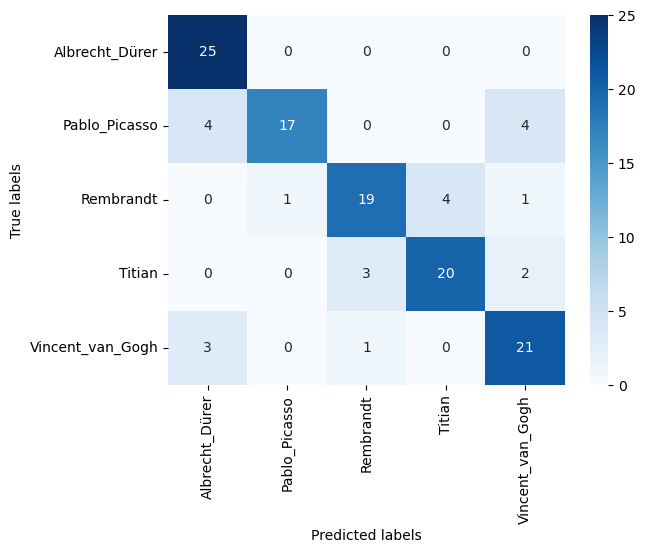

In [41]:
# Get class indices from the test generator
class_indices = test_generator.class_indices

# Invert the dictionary to map numeric labels to class names
class_names = {v: k for k, v in class_indices.items()}

# Generate predicted labels for test set
y_pred = model9.predict(test_generator)
y_pred_labels = np.argmax(y_pred, axis=1)

# Get true labels for test set
y_true = test_generator.classes

# Compute confusion matrix
conf_mat = confusion_matrix(y_true, y_pred_labels)

# Visualize confusion matrix as heatmap with class names
sns.heatmap(conf_mat, annot=True, cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()


2023-04-20 11:47:59.561479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 [==============================] - 17s 3s/step


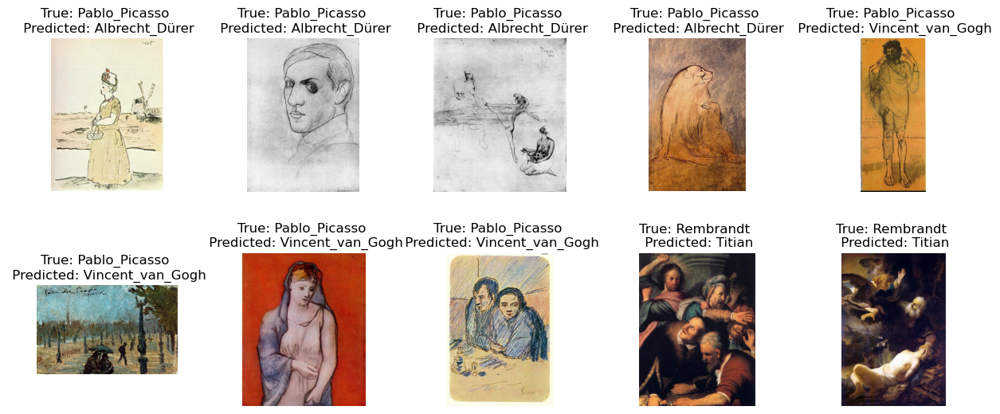

In [50]:
# Generate predicted labels for test set
y_pred = model9.predict(test_generator)
y_pred_labels = np.argmax(y_pred, axis=1)

# Get true labels for test set
y_true = test_generator.classes

# Find misclassified images
misclassified_idx = np.where(y_pred_labels != y_true)[0]
misclassified_images = np.array(test_generator.filepaths)[misclassified_idx]

# Display some misclassified images
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

for i in range(10):
    img = Image.open(misclassified_images[i])
    axes[i].imshow(img)
    axes[i].set_title(f"True: {class_names[y_true[misclassified_idx[i]]]} \n Predicted: {class_names[y_pred_labels[misclassified_idx[i]]]}")
    axes[i].axis('off')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()



## Project Summary

In summary, this machine learning project utilizes deep learning techniques to identify the painter of a painting from an image. By training the model on a dataset of paintings by five prominent artists, the Metropolitan Museum of Art can use the model to verify the authenticity of paintings attributed to Van Gogh, Durer, Picasso, Titian, and Rembrandt.

The project involves preprocessing the image data, model training, and evaluation using metrics such as accuracy. By analyzing the unique style and characteristics of each artist's work, the model can compare a new painting to known works by the same artist and provide an expert opinion on its authenticity.

This project can be used to prevent the spread of forgeries and imitations in the art market, which helps to ensure its integrity. The dataset used for training the model is the "Best Artworks of All Time" dataset obtained from Kaggle, which contains over 8,400 paintings by 50 influential artists. The model is trained to identify paintings by five of these artists, namely Van Gogh, Durer, Picasso, Titian, and Rembrandt.

The project involves several key phases, including exploratory data analysis, data augmentation and preprocessing, model training, and evaluation. Baseline convolutional neural network models and more advanced models using transfer learning techniques were created, and the best-performing model was identified based on accuracy. Initial accuracy was 0.66 and best results achieved among 15 CNN models via Transfer Learning VGG19 model with accuracy of 0.81. Overall, this project has significant implications for the art market, and it provides a useful tool for museums, collectors, and dealers in verifying the authenticity of paintings.